In [6]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

In [7]:
# loading 10x Genomics Visium data
adata = sc.read_visium('Visium_FFPE_Human_Normal_Prostate_spatial', count_file='Visium_FFPE_Human_Normal_Prostate_filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

C:\Users\moham\anaconda3\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\moham\anaconda3\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
adata

AnnData object with n_obs × n_vars = 2543 × 17943
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
# calculating quality metrics
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [10]:
adata

AnnData object with n_obs × n_vars = 2543 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

C:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

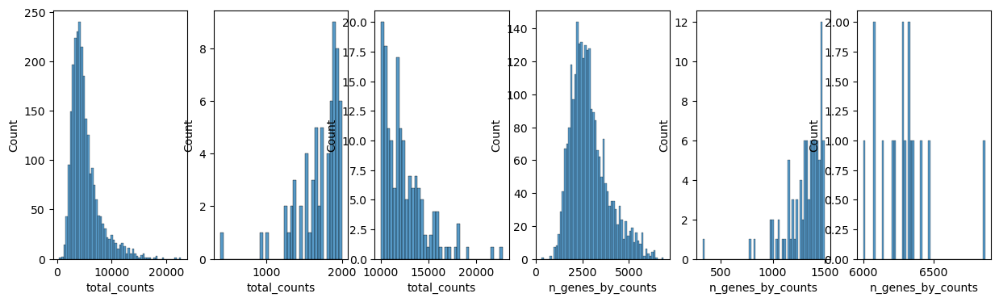

In [11]:
fig, axs = plt.subplots(1, 6, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 2000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] > 10000],
    kde=False,
    bins=40,
    ax=axs[2],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[3])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 1500],
    kde=False,
    bins=60,
    ax=axs[4],
)
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] > 6000],
    kde=False,
    bins=60,
    ax=axs[5],
)

C:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='pct_counts_mt', ylabel='Count'>

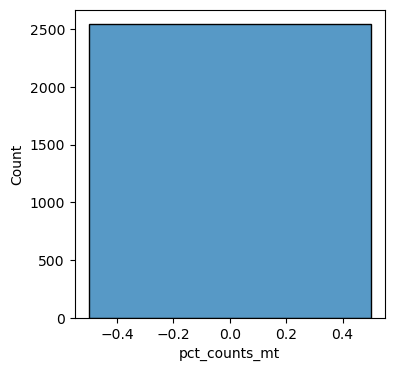

In [12]:
fig, axs = plt.subplots(1, 1, figsize=(4, 4))
sns.histplot(adata.obs["pct_counts_mt"], kde=False)


In [13]:
# Filter out spots with fewer than 5,000 total counts.
sc.pp.filter_cells(adata, min_counts=1500)
# Filter out spots with more than 35,000 total counts.
sc.pp.filter_cells(adata, max_counts=15000)
print(f"Spots after counts filter: {adata.n_obs}")
# Filter out cells where the percentage of counts from mitochondrial genes is above 5%.
adata = adata[adata.obs["pct_counts_mt"] < 5].copy()
print(f"Spots after MT filter: {adata.n_obs}")
# Filter out genes that are detected in fewer than 10 spots.
sc.pp.filter_genes(adata, min_cells=10)

Spots after counts filter: 2510
Spots after MT filter: 2510


In [14]:
# Normalize
sc.pp.normalize_total(adata, inplace=True)
# Logarithmize
sc.pp.log1p(adata)
# Extracting highly variable genes
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


In [15]:
# Calculating PCA
sc.pp.pca(adata)
# Calcualting the neighborhood graph
sc.pp.neighbors(adata)
# calculating the UMAP
sc.tl.umap(adata)

## Clustering

In [16]:
# clustering with Leiden
sc.tl.leiden(
    adata, key_added="clusters", resolution = 0.7, directed=False, n_iterations=2
)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


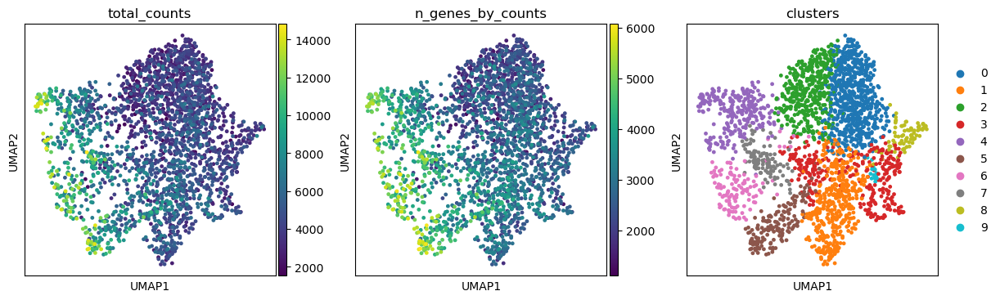

In [42]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.2)

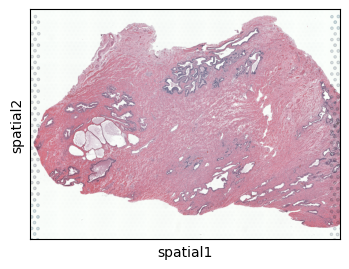

In [18]:
sc.pl.spatial(adata, img_key="hires")

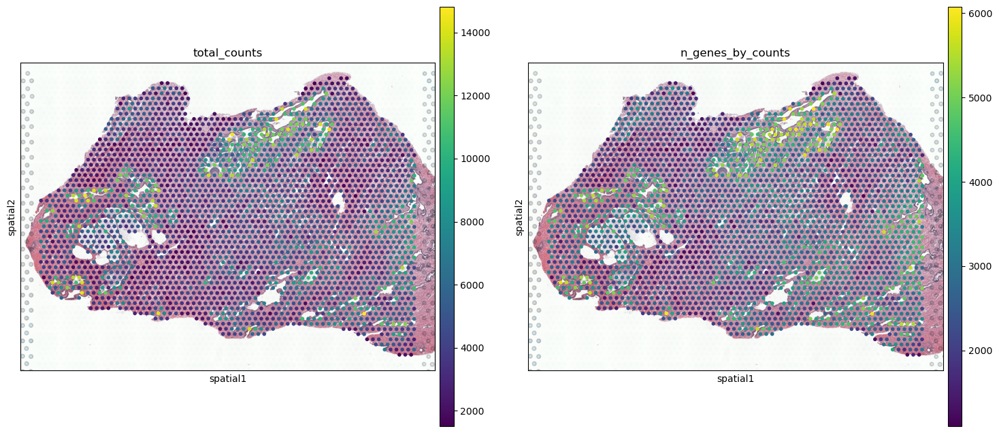

In [19]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


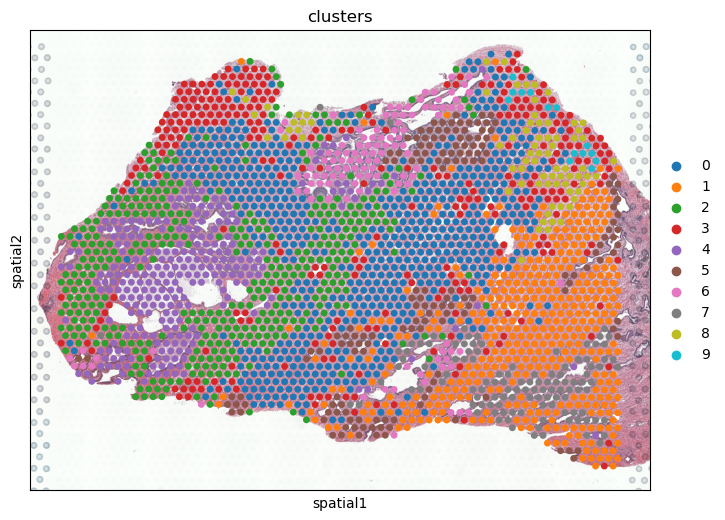

In [20]:
sc.pl.spatial(adata, img_key="hires", color=["clusters"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


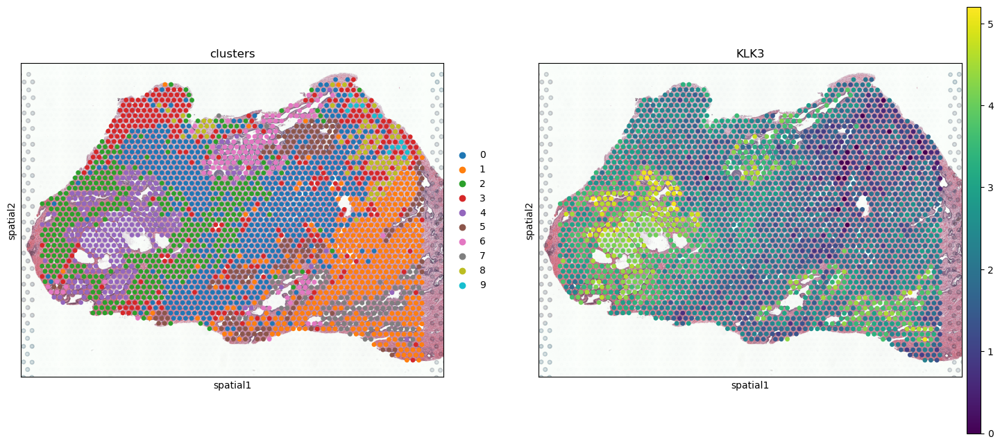

In [21]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "KLK3"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


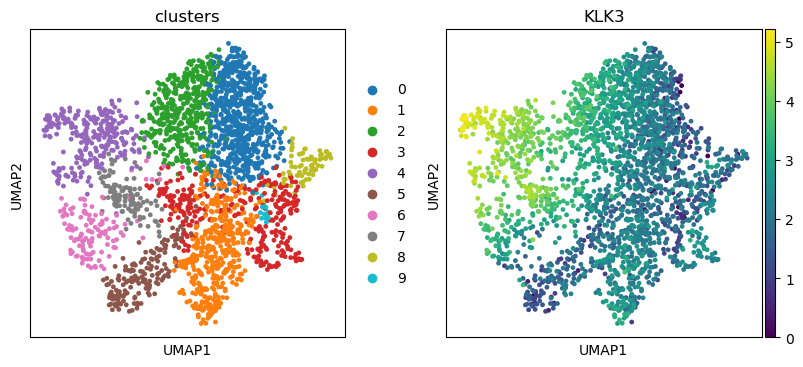

In [44]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["clusters", "KLK3"], wspace=0.2)

categories: 0, 1, 2, etc.
var_group_labels: 3


C:\Users\moham\anaconda3\Lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


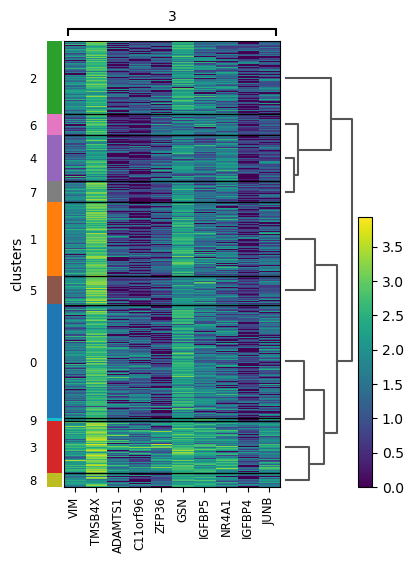

In [23]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="3", n_genes=10, groupby="clusters")

categories: 0, 1, 2, etc.
var_group_labels: 8


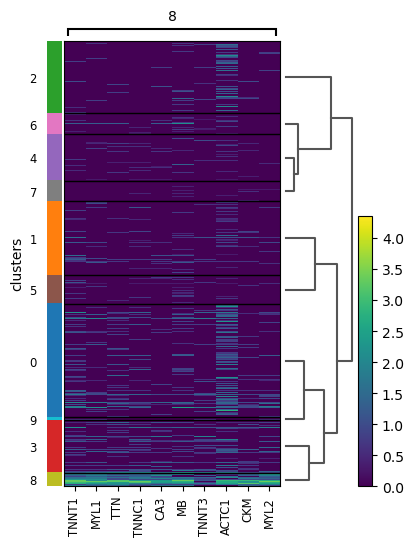

In [24]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="8", n_genes=10, groupby="clusters")

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


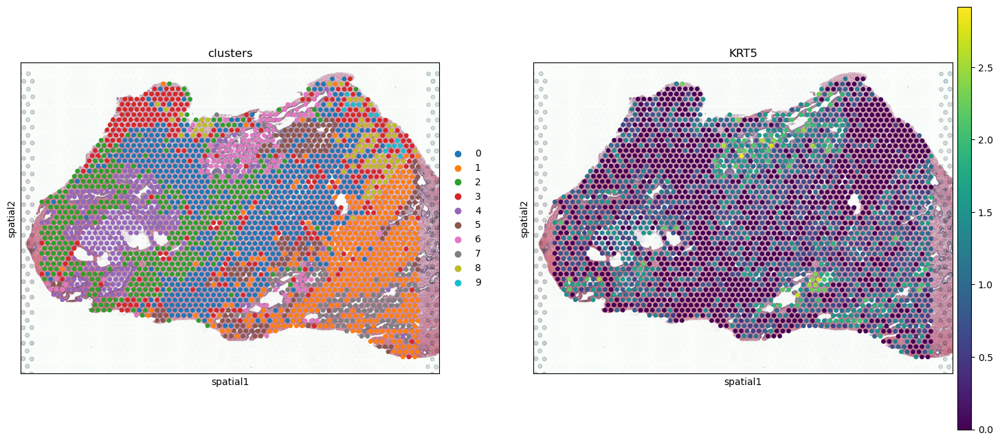

In [25]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "KRT5"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


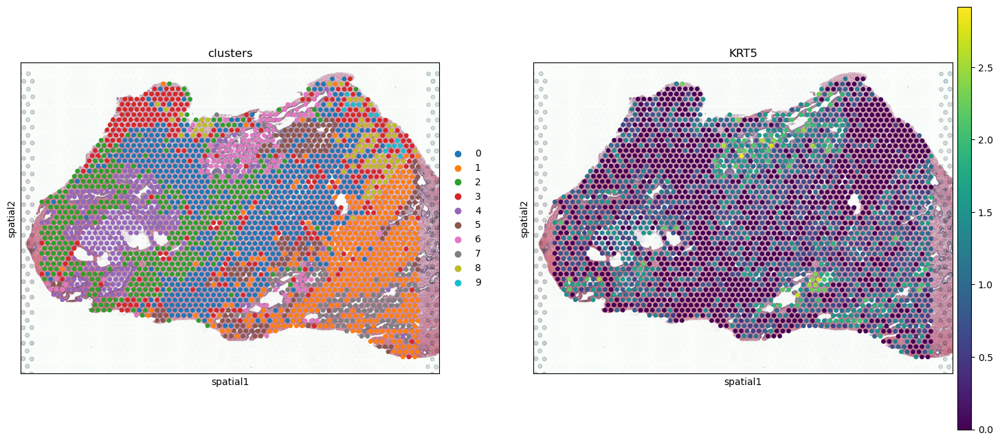

In [26]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "KRT5"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


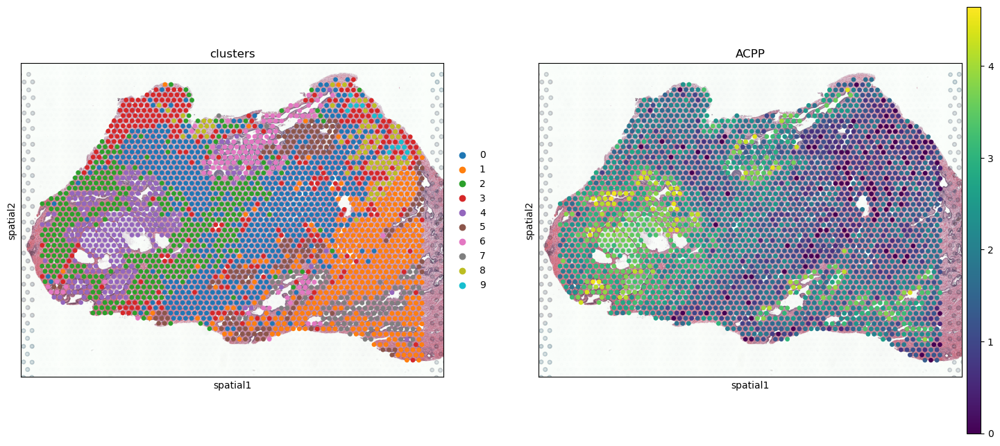

In [27]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "ACPP"], alpha=1, size=1.2)

### Fib

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


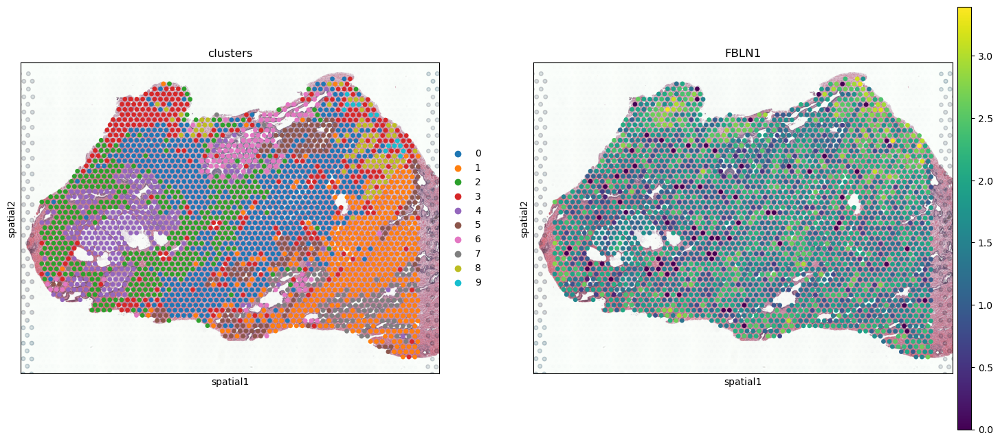

In [28]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "FBLN1"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


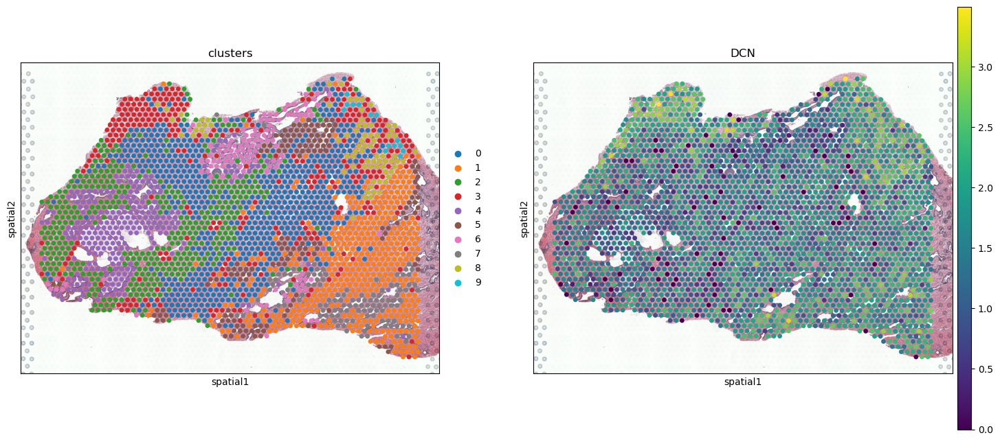

In [29]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "DCN"], alpha=1, size=1.2)

### SM

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


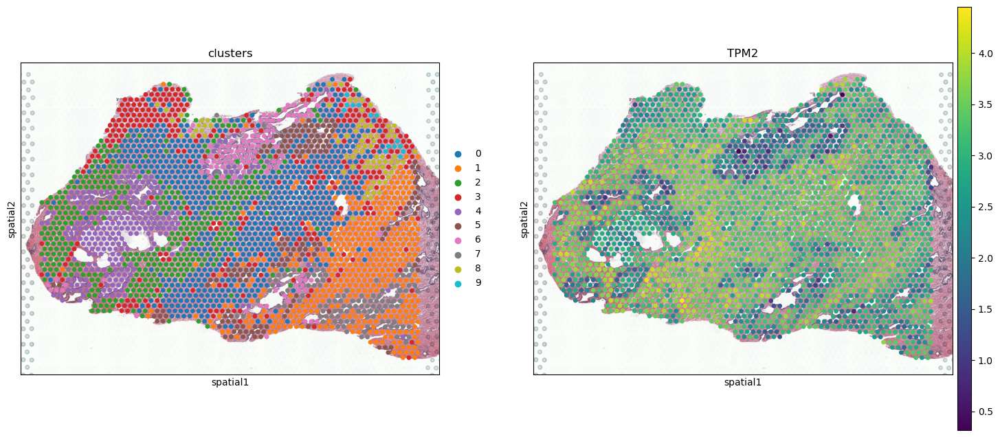

In [30]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "TPM2"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


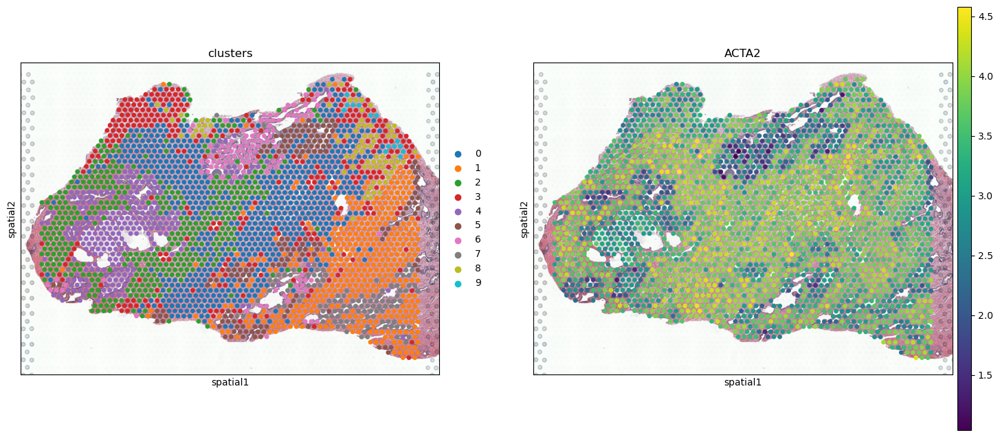

In [31]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "ACTA2"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


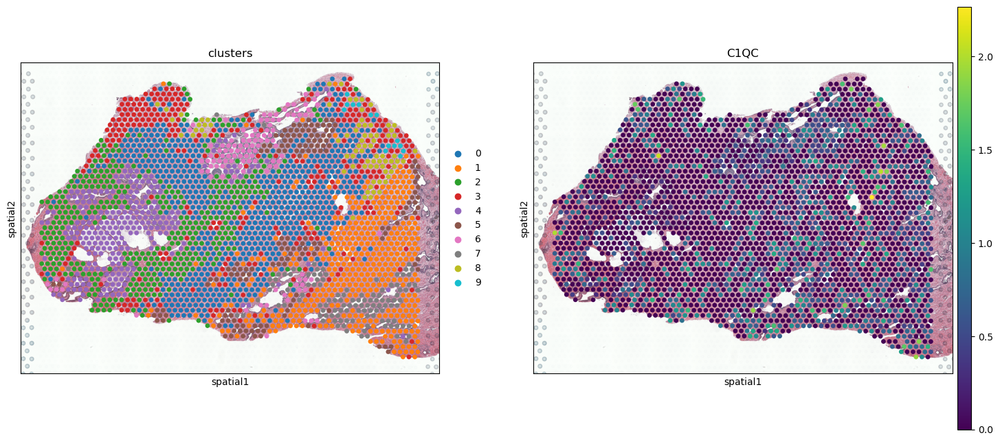

In [32]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "C1QC"], alpha=1, size=1.2)

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


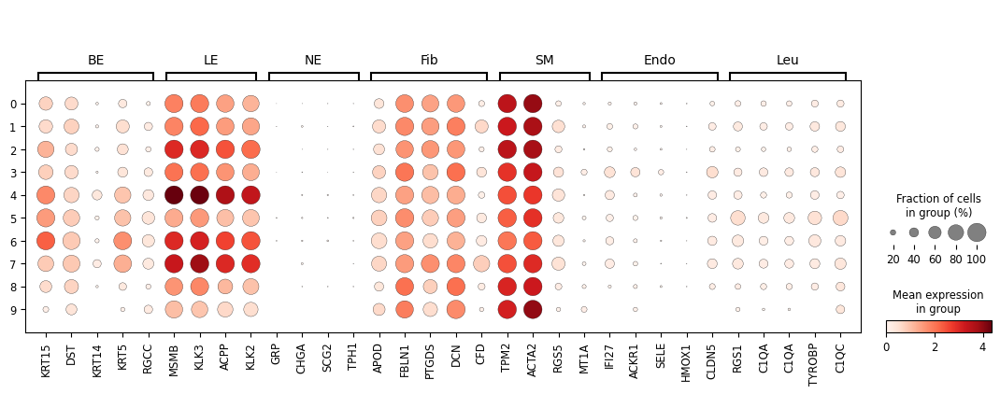

In [33]:
# Marker genes to cell type dictionary
marker_genes_dict = {
    'BE': ['KRT15', 'DST', 'KRT14', 'KRT5', 'RGCC'],
    'LE': ['MSMB', 'KLK3', 'ACPP', 'KLK2'],
    'NE': ['GRP', 'CHGA', 'SCG2', 'TPH1'],
    'Fib': ['APOD', 'FBLN1', 'PTGDS', 'DCN', 'CFD'],
    'SM': ['TPM2', 'ACTA2', 'RGS5', 'MT1A'],
    'Endo': ['IFI27', 'ACKR1', 'SELE', 'HMOX1', 'CLDN5'],
    'Leu': ['RGS1', 'C1QA', 'C1QA', 'TYROBP', 'C1QC'],
}

# Dotplot for visualization that combines gene expression data for these specific markers of cell types
# with clustering information
sc.pl.dotplot(adata, marker_genes_dict, 'clusters')

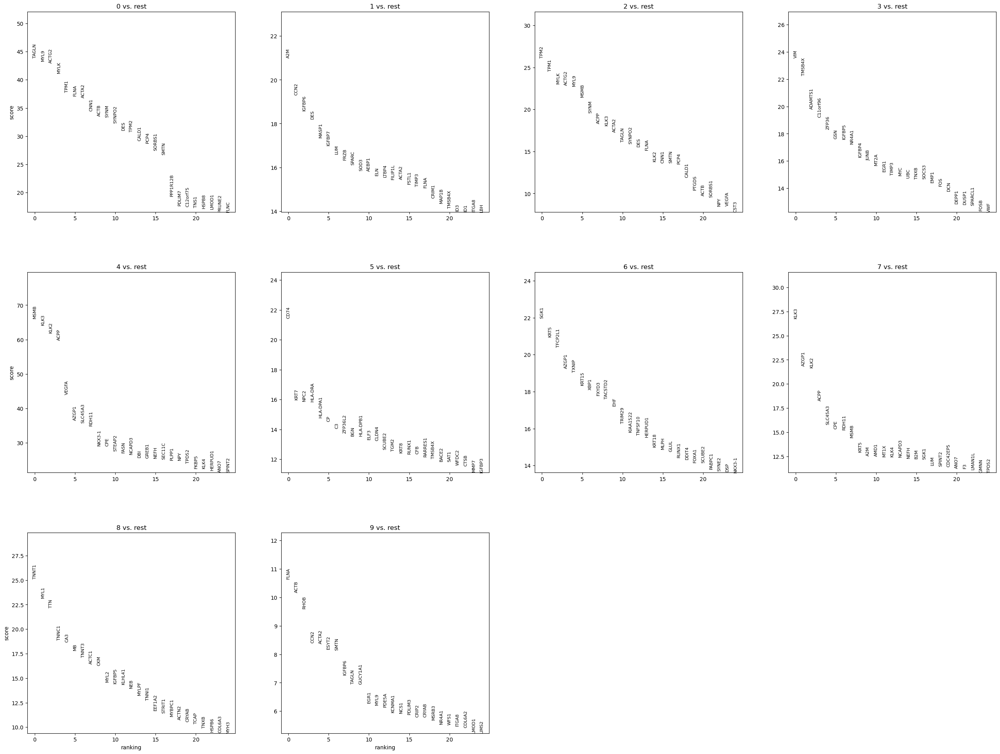

In [34]:
sc.tl.rank_genes_groups(adata, 'clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [35]:
import squidpy as sq

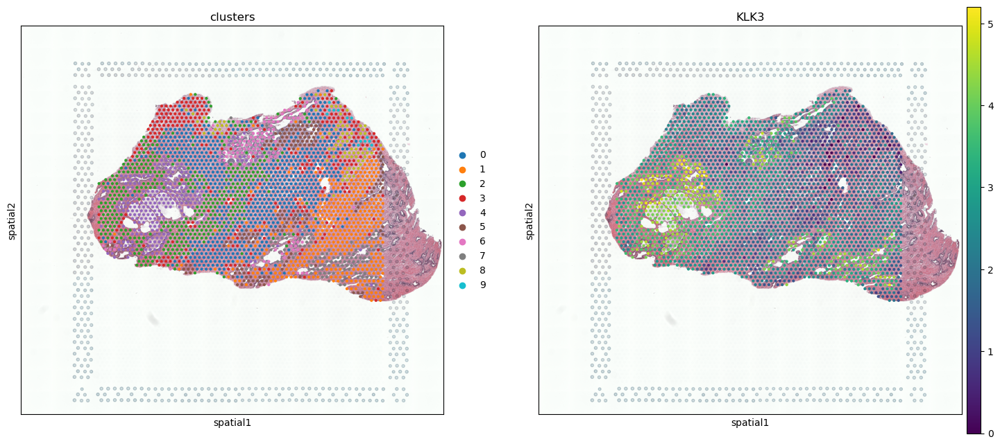

In [38]:
sq.pl.spatial_scatter(adata, color=['clusters', 'KLK3'])


In [39]:
sq.gr.spatial_neighbors(adata)

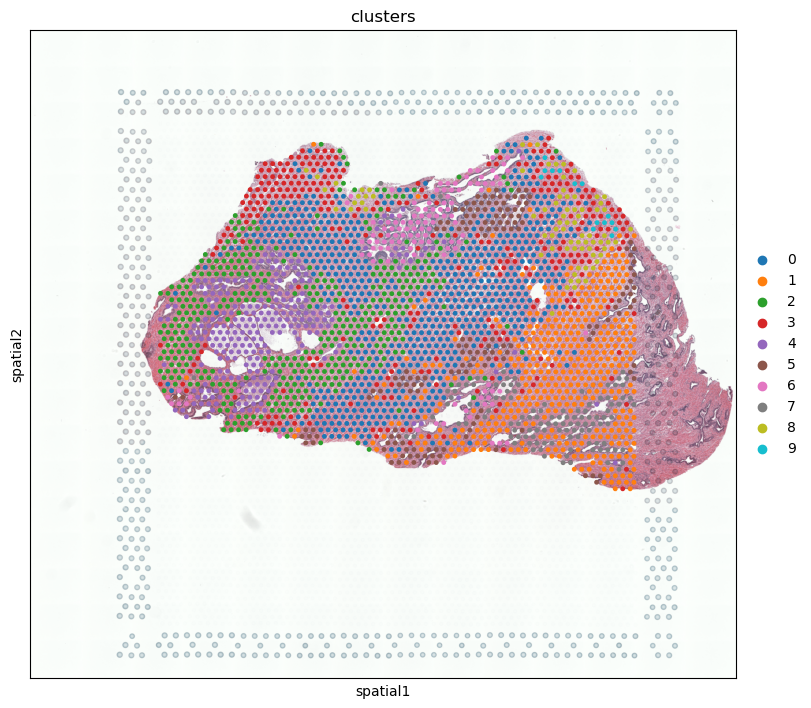

In [41]:
sq.pl.spatial_scatter(adata, color='clusters')

C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\moham\anaconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


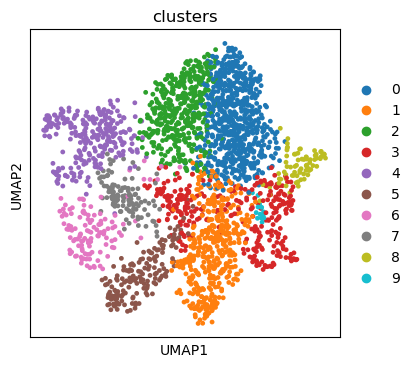

In [43]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["clusters"], wspace=0.2)